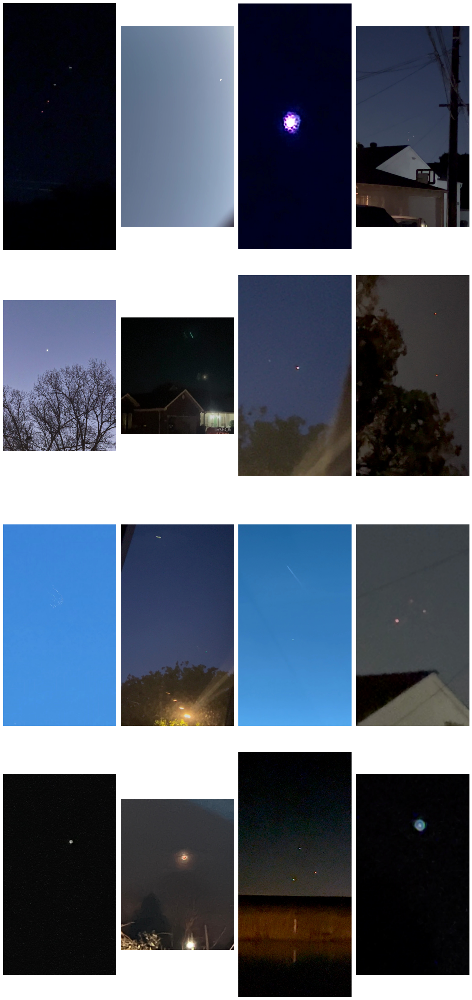

In [1]:
# Visualize all images in the data directory
import os

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Specify the data directory
data_directory = "data/"

# List all image files in the directory
image_files = [f for f in os.listdir(data_directory) if f.endswith(('.png', '.jpg', '.jpeg'))]

# Set up the grid dimensions
columns = 4
rows = -(-len(image_files) // columns)  # Calculate the number of rows needed

# Create a figure
fig, axes = plt.subplots(rows, columns, figsize=(15, rows * 8))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Loop through the images and plot them
for i, image_file in enumerate(image_files):
    image_path = os.path.join(data_directory, image_file)
    img = mpimg.imread(image_path)
    axes[i].imshow(img)
    axes[i].axis('off')  # Turn off axes

# Turn off any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


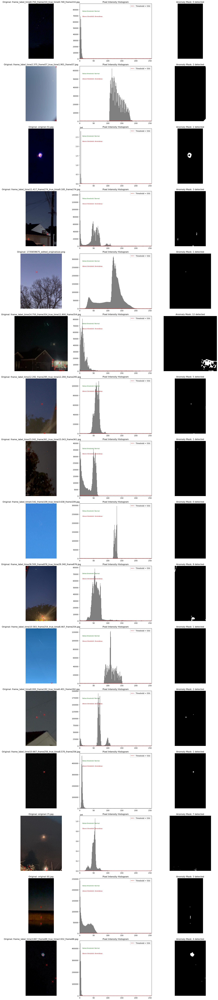

No anomalies detected in frame_label_time8.750_frame210_true_time8.749_frame210.jpg


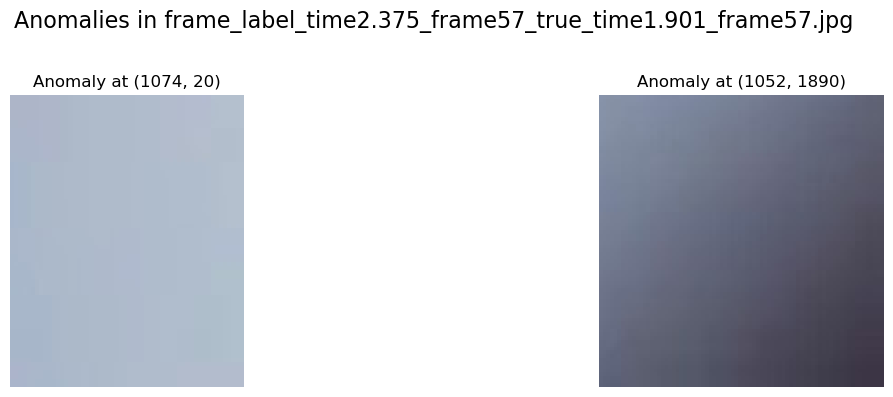

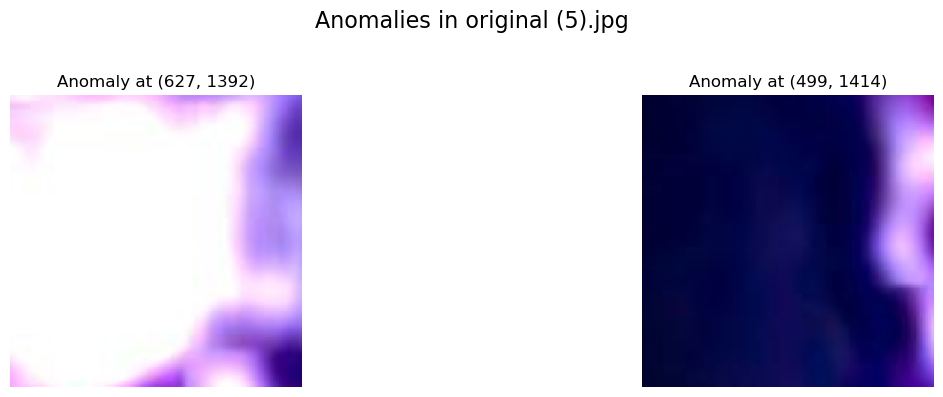

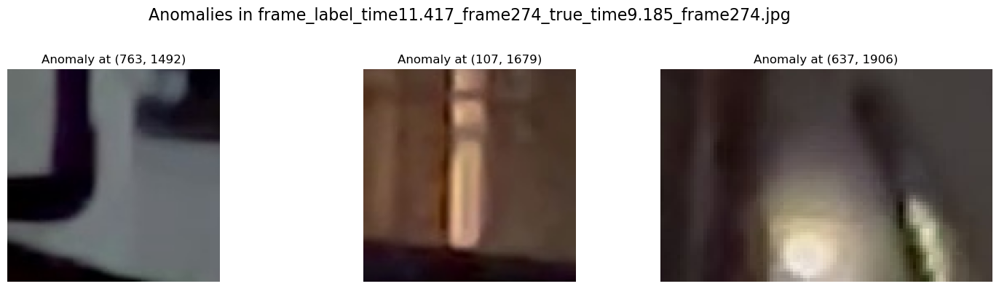

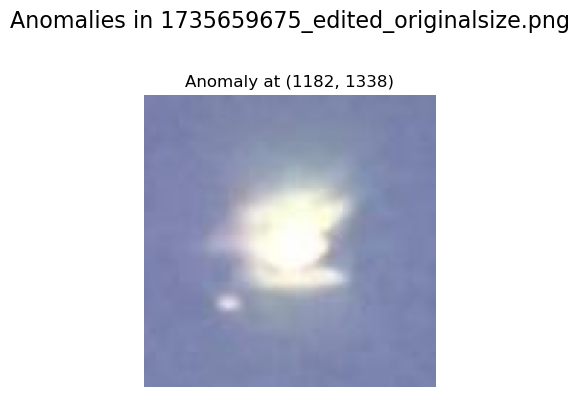

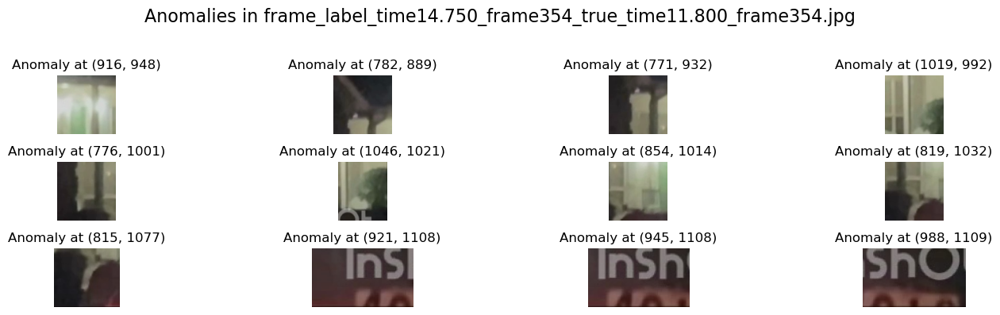

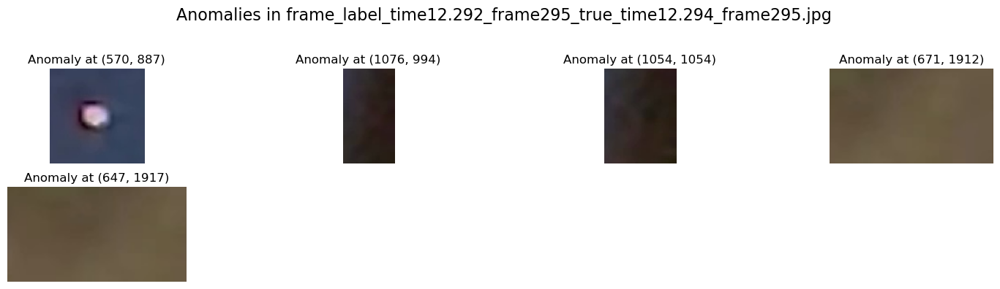

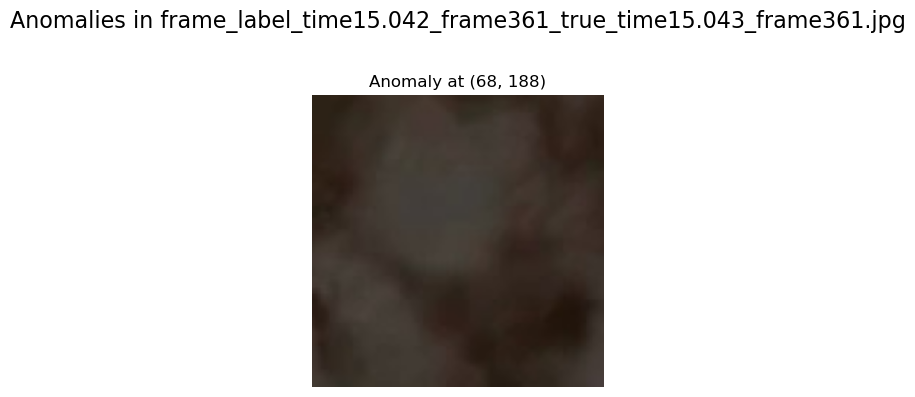

No anomalies detected in frame_label_time4.542_frame109_true_time3.638_frame109.jpg


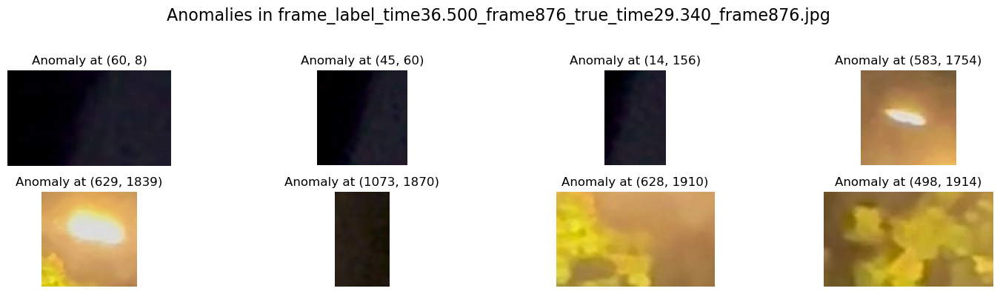

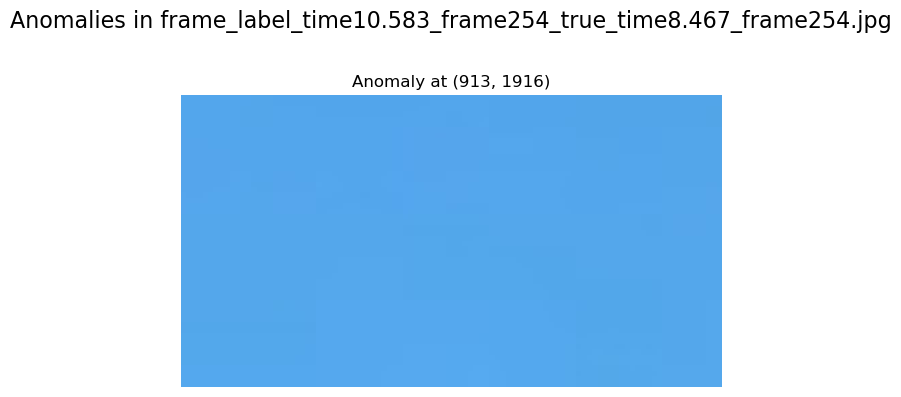

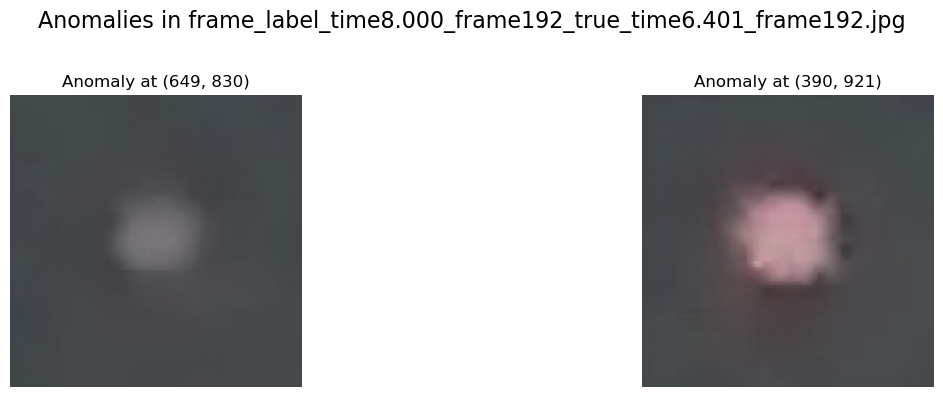

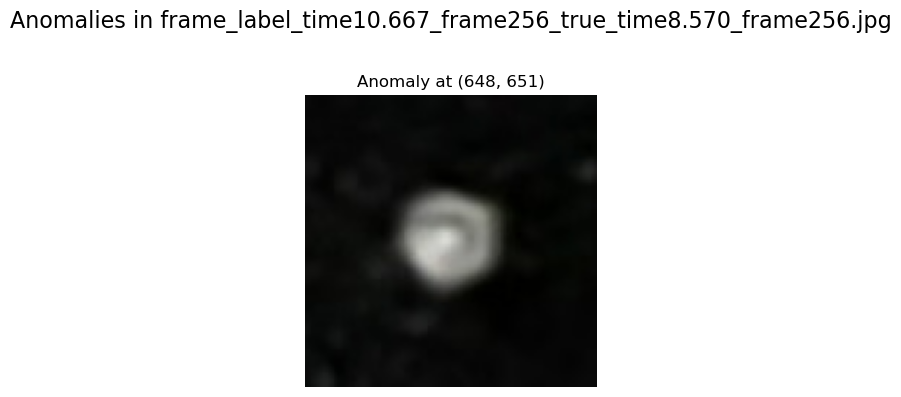

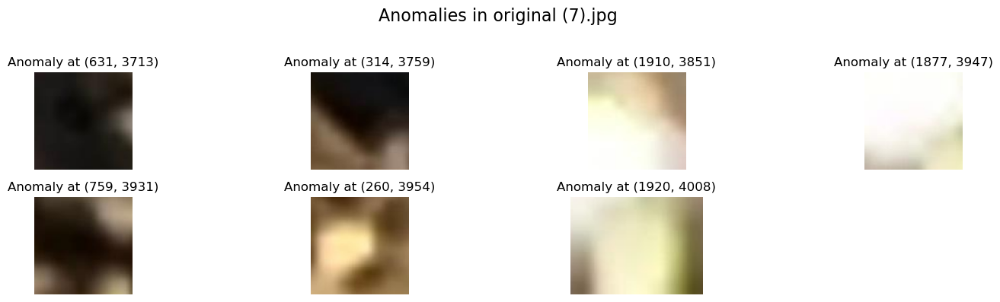

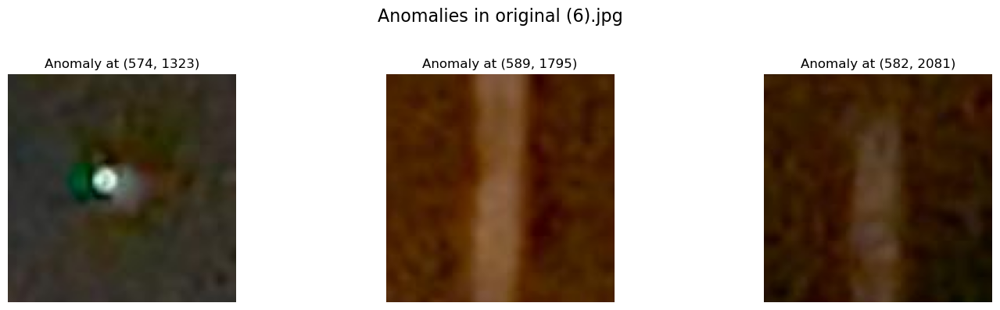

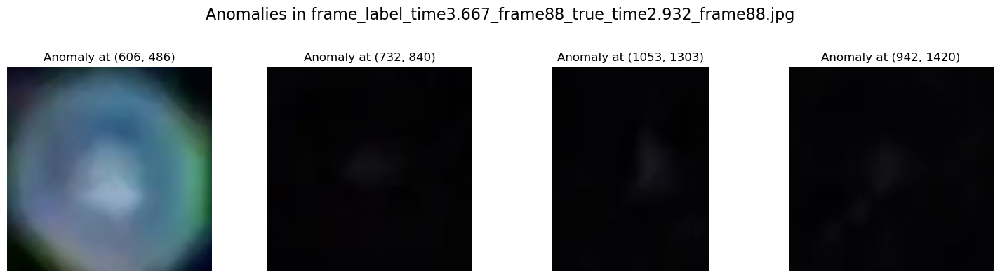

In [2]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from utils import anomaly_detection

# Process all images using the anomaly detection algorithm
results = []
threshold = 550  # Set the threshold value

for image_file in image_files:
    image_path = os.path.join(data_directory, image_file)
    
    # Read image with cv2 for processing (BGR format)
    img_cv2 = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img_cv2, cv2.COLOR_BGR2RGB)
    
    # Apply anomaly detection
    segmentation_mask, anomalies = anomaly_detection(img_rgb, threshold=threshold)
    
    # Calculate histogram for visualization
    gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
    hist = cv2.calcHist([gray], [0], None, [256], [0, 256])
    hist = hist.flatten()
    
    # Store results
    results.append({
        'filename': image_file,
        'image': img_rgb,
        'mask': segmentation_mask,
        'anomalies': anomalies,
        'histogram': hist
    })

# Display results: original image, histogram with threshold, and segmentation mask
columns = 3
rows = len(image_files)

plt.figure(figsize=(18, rows * 5))

for i, result in enumerate(results):
    # Original image with anomalies marked
    plt.subplot(rows, columns, i*columns + 1)
    plt.imshow(result['image'])
    plt.title(f"Original: {result['filename']}")
    plt.axis('off')
    
    # Mark anomalies with red X
    for anomaly in result['anomalies']:
        plt.plot(anomaly['coords'][0], anomaly['coords'][1], 'rx', markersize=10, linewidth=3)
    
    # Histogram with threshold line
    plt.subplot(rows, columns, i*columns + 2)
    plt.bar(range(256), result['histogram'], width=1, color='gray')
    plt.axhline(y=threshold, color='r', linestyle='--', 
               label=f'Threshold = {threshold}')
    plt.xlim([0, 256])
    plt.legend()
    plt.title('Pixel Intensity Histogram')
    
    # Add annotations for normal vs anomalous regions
    max_hist = np.max(result['histogram'])
    plt.text(10, max_hist*0.9, "Below threshold: Normal", 
             color='green', fontsize=8)
    plt.text(10, max_hist*0.8, "Above threshold: Anomalous", 
             color='red', fontsize=8)
    
    # Segmentation mask
    plt.subplot(rows, columns, i*columns + 3)
    plt.imshow(result['mask'], cmap='gray')
    plt.title(f"Anomaly Mask: {len(result['anomalies'])} detected")
    plt.axis('off')

plt.tight_layout()
plt.show()

# Display anomaly patches for each image
for result in results:
    if result['anomalies']:
        plt.figure(figsize=(15, 4))
        plt.suptitle(f"Anomalies in {result['filename']}", fontsize=16)
        
        # Determine grid dimensions for anomaly patches
        num_anomalies = len(result['anomalies'])
        patch_cols = min(4, num_anomalies)  # At most 4 columns
        patch_rows = (num_anomalies + patch_cols - 1) // patch_cols
        
        for j, anomaly in enumerate(result['anomalies']):
            plt.subplot(patch_rows, patch_cols, j+1)
            plt.imshow(anomaly['patch'])
            plt.title(f"Anomaly at ({anomaly['coords'][0]}, {anomaly['coords'][1]})")
            plt.axis('off')
        
        plt.tight_layout(rect=[0, 0, 1, 0.95])  # Make room for suptitle
        plt.show()
    else:
        print(f"No anomalies detected in {result['filename']}")

/Users/tmagcaya/miniconda3/envs/torch/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/Users/tmagcaya/miniconda3/envs/torch/lib/python3.9/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: 'dlopen(/Users/tmagcaya/miniconda3/envs/torch/lib/python3.9/site-packages/torchvision/image.so, 0x0006): Symbol not found: __ZN3c1017RegisterOperatorsD1Ev
  Referenced from: <2D1B8D5C-7891-3680-9CF9-F771AE880676> /Users/tmagcaya/miniconda3/envs/torch/lib/python3.9/site-packages/torchvision/image.so
  Expected in:     <BB0447B8-76A2-36EA-B7E1-E74DEE76777F> /Users/tmagcaya/miniconda3/envs/torch/lib/python3.9/site-packages/torch/lib/libtorch_cpu.dylib'If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be somet

Depth model loaded successfully


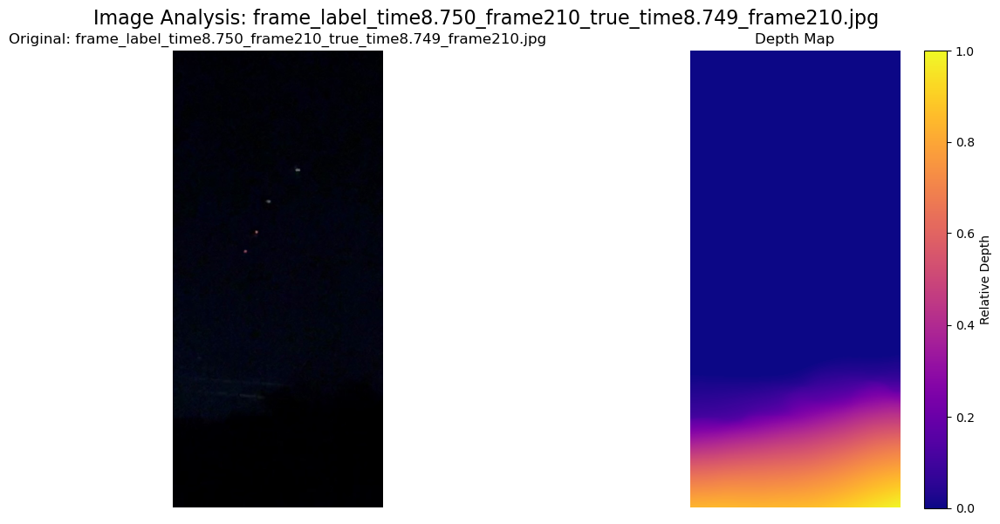

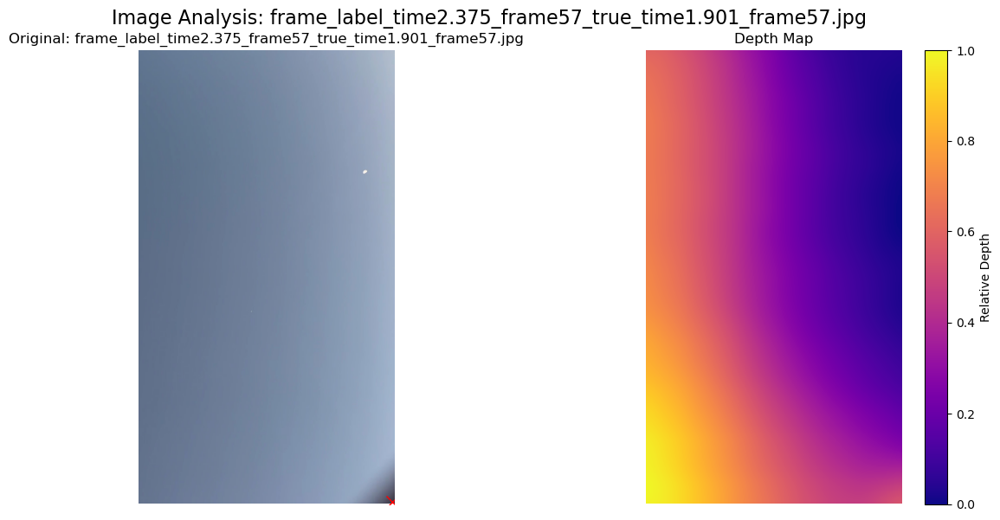

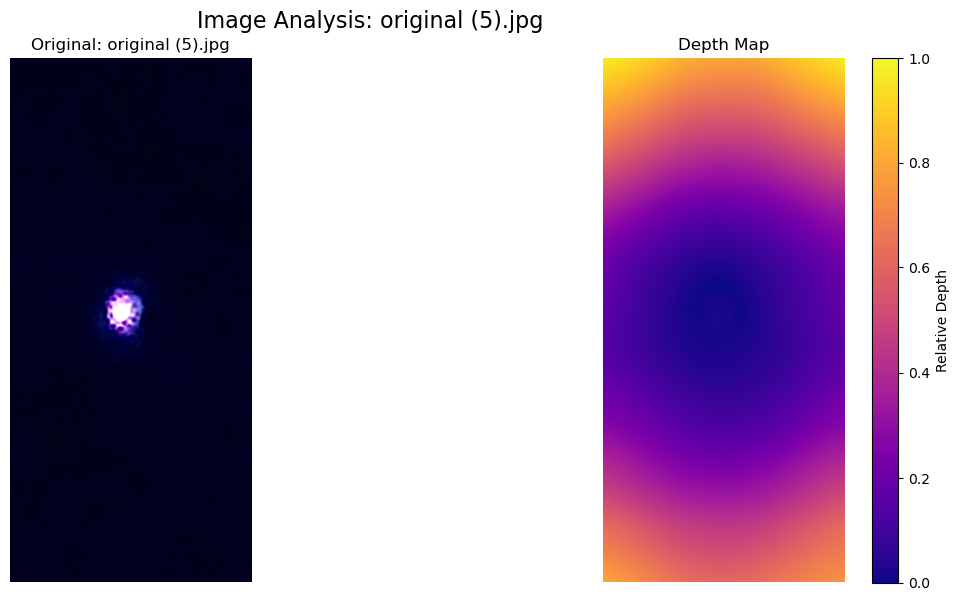

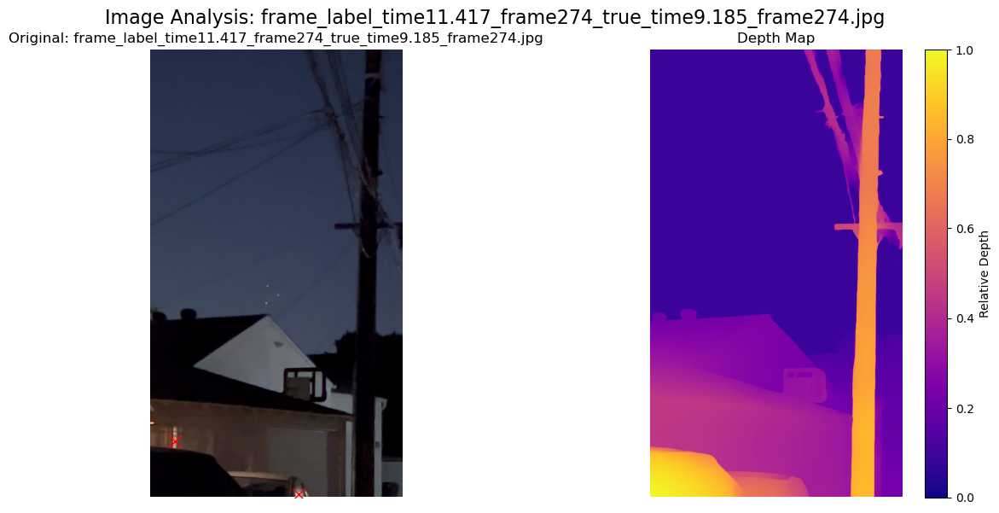

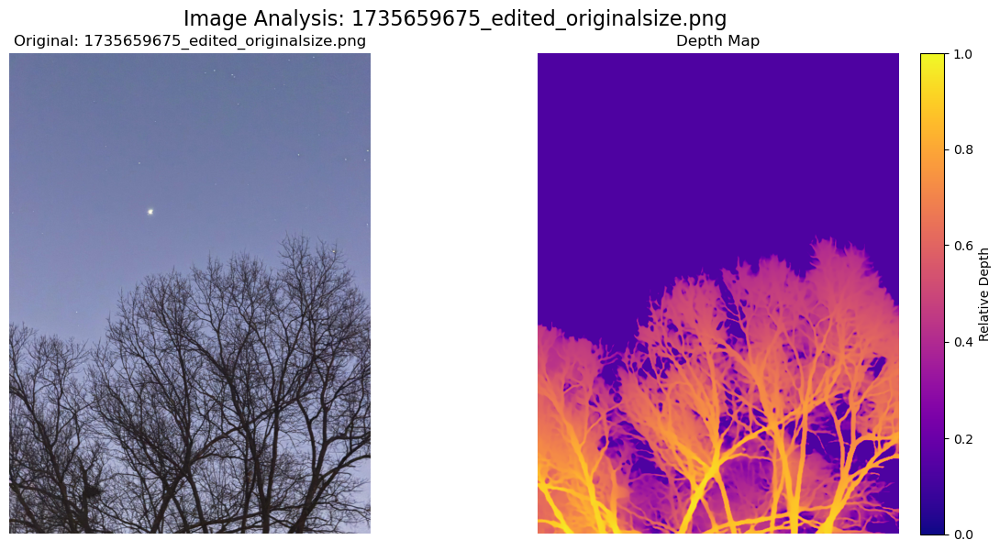

...

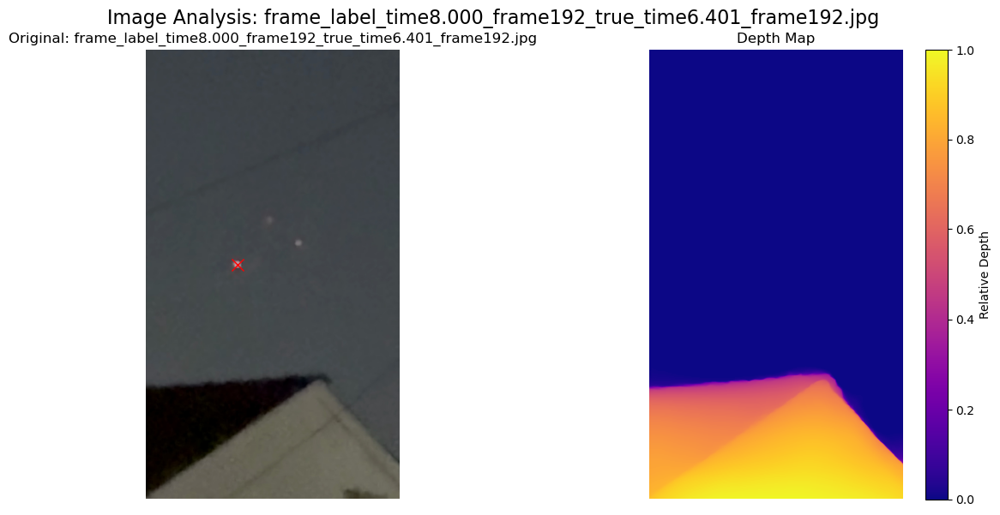

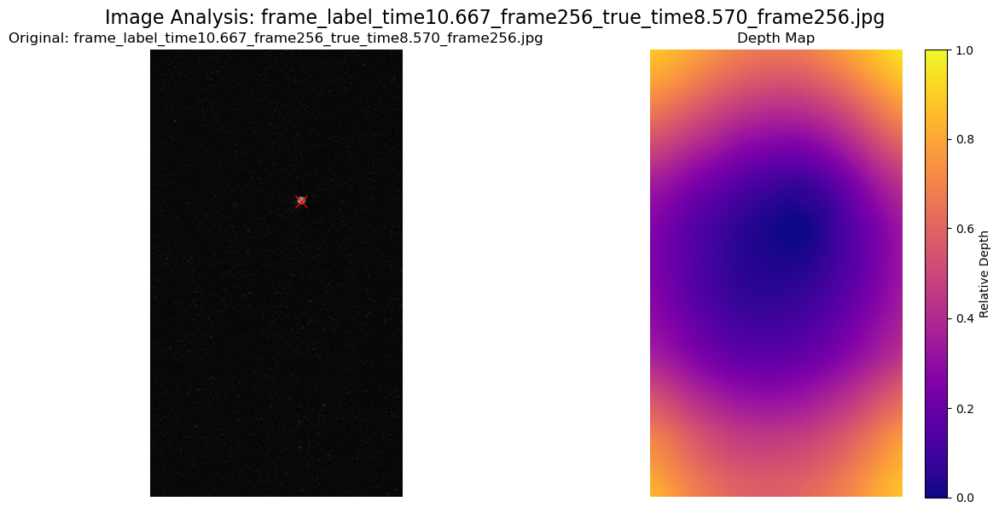

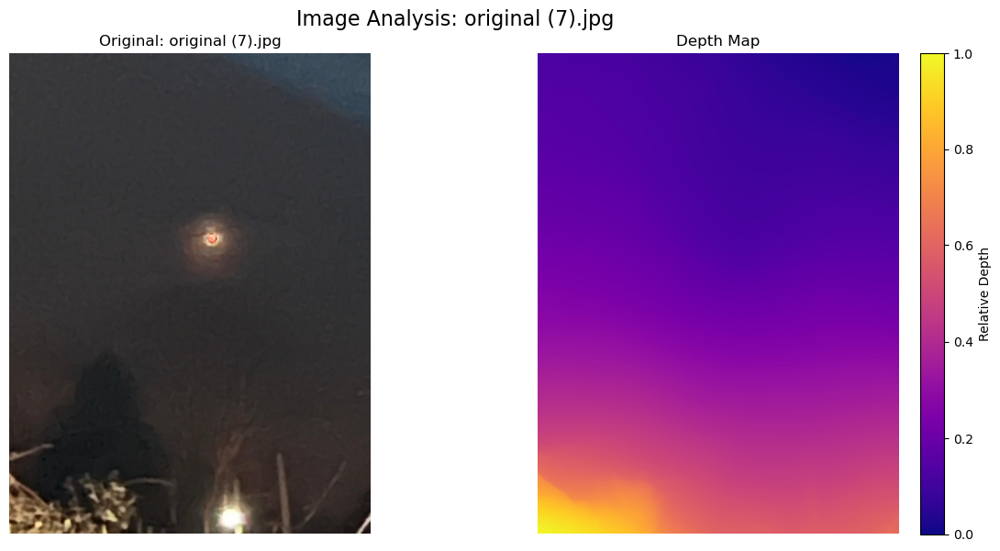

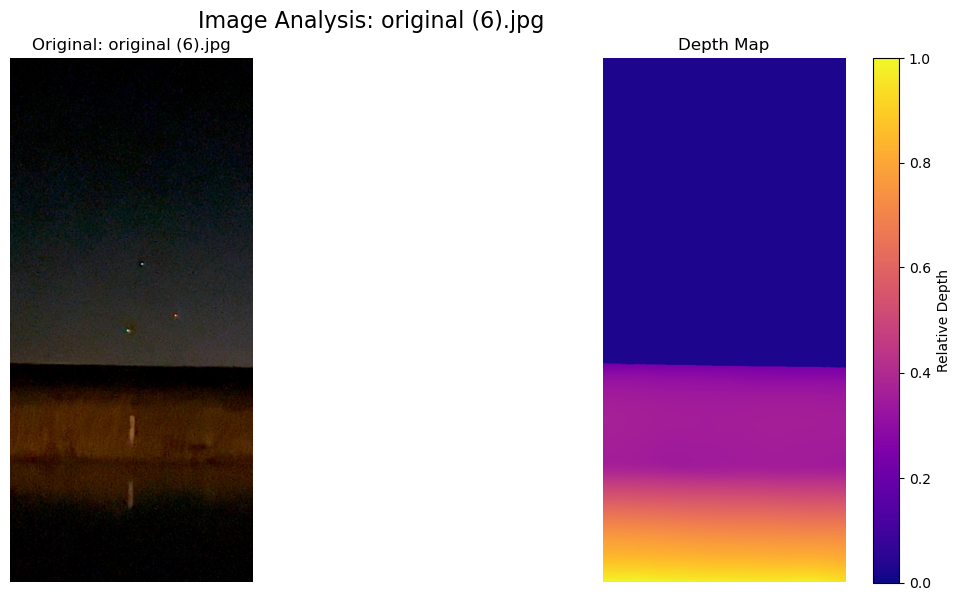

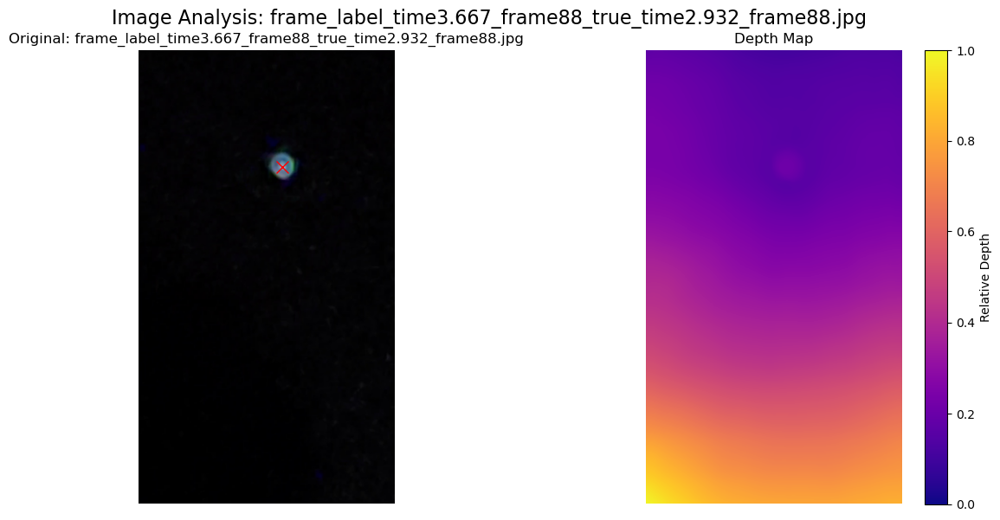

In [3]:
import os
# Set this before importing torch
os.environ['PYTORCH_ENABLE_MPS_FALLBACK'] = '1'
# Disable MPS completely to force CPU
os.environ['PYTORCH_MPS_DEVICE'] = ''

import numpy as np
import sys

# Directly patch the specific attributes without using __getattr__
# This avoids the recursion problem
np.object = object
np.bool = bool
np.float = float
np.int = int
np.str = str
np.typeDict = {str: str, int: int, float: float, bool: bool, object: object}

# Now safe to import other modules
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from utils import anomaly_detection
from transformers import pipeline
from PIL import Image

# Specify the data directory
data_directory = "data/"

# Initialize depth estimation model
depth_model = pipeline(
    task="depth-estimation", 
    model="depth-anything/Depth-Anything-V2-Small-hf",
    device="cpu"  # Explicitly force CPU
)
print("Depth model loaded successfully")

# List all image files in the directory
image_files = [f for f in os.listdir(data_directory) if f.endswith(('.png', '.jpg', '.jpeg'))]

# Process and visualize each image
for image_file in image_files:
    image_path = os.path.join(data_directory, image_file)
    
    # Load image for display
    img_display = mpimg.imread(image_path)
    
    # Load image for processing with cv2
    img_cv2 = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img_cv2, cv2.COLOR_BGR2RGB)
    
    # Apply anomaly detection
    segmentation_mask, anomalies = anomaly_detection(img_rgb, threshold=55)
    
    # Get depth estimation
    pil_image = Image.open(image_path)
    depth_result = depth_model(pil_image)
    depth_map = depth_result["depth"]
    
    # Convert depth map to numpy array for visualization
    depth_np = np.array(depth_map)
    
    # Normalize depth for better visualization
    depth_normalized = (depth_np - depth_np.min()) / (depth_np.max() - depth_np.min())
    
    # Create a figure with 2 columns
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    
    # Display original image with anomalies marked
    axes[0].imshow(img_display)
    axes[0].set_title(f"Original: {image_file}")
    axes[0].axis('off')
    
    # Mark anomalies with red X
    for anomaly in anomalies:
        axes[0].plot(anomaly['coords'][0], anomaly['coords'][1], 'rx', markersize=10, linewidth=3)
    
    # Display depth map
    depth_display = axes[1].imshow(depth_normalized, cmap='plasma')
    axes[1].set_title("Depth Map")
    axes[1].axis('off')
    
    # Add a colorbar
    cbar = plt.colorbar(depth_display, ax=axes[1], fraction=0.046, pad=0.04)
    cbar.set_label('Relative Depth')
    
    plt.tight_layout()
    plt.suptitle(f"Image Analysis: {image_file}", fontsize=16)
    plt.subplots_adjust(top=0.9)
    plt.show()
    
    # Optionally show anomaly patches
    # if anomalies:
    #     plt.figure(figsize=(10, 4))
    #     plt.suptitle(f"Anomalies in {image_file}", fontsize=16)
        
    #     # Determine grid dimensions for anomaly patches
    #     num_anomalies = len(anomalies)
    #     patch_cols = min(4, num_anomalies)
    #     patch_rows = (num_anomalies + patch_cols - 1) // patch_cols
        
    #     for j, anomaly in enumerate(anomalies):
    #         plt.subplot(patch_rows, patch_cols, j+1)
    #         plt.imshow(anomaly['patch'])
    #         plt.title(f"Anomaly at ({anomaly['coords'][0]}, {anomaly['coords'][1]})")
    #         plt.axis('off')
        
    #     plt.tight_layout(rect=[0, 0, 1, 0.95])
    #     plt.show()
    # else:
    #     print(f"No anomalies detected in {image_file}")

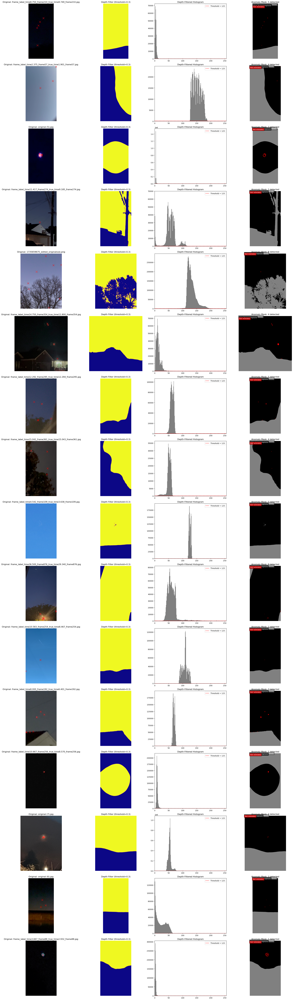

In [4]:
# Now, let's visualize the depth-guided anomaly detection results

import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from utils import anomaly_detection, depth_guided_anomaly_detection

# Process all images using the depth-guided anomaly detection
results = []
threshold = 125  # Histogram threshold value
depth_threshold = 0.3  # Depth threshold (tunable) 

for image_file in image_files:
    image_path = os.path.join(data_directory, image_file)
    
    # Read image with cv2 for processing
    img_cv2 = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img_cv2, cv2.COLOR_BGR2RGB)
    
    # Get depth estimation
    pil_image = Image.open(image_path)
    depth_result = depth_model(pil_image)
    depth_map = np.array(depth_result["depth"])
    
    # Normalize depth for thresholding
    depth_normalized = (depth_map - depth_map.min()) / (depth_map.max() - depth_map.min())
    
    # Create depth mask - True for pixels to include (closer than depth_threshold)
    depth_mask = depth_normalized <= depth_threshold
    
    # Convert to format usable with cv2
    depth_mask_cv = depth_mask.astype(np.uint8) * 255
    
    # Apply anomaly detection with depth filtering
    segmentation_mask, anomalies = depth_guided_anomaly_detection(
        img_rgb, 
        depth_mask, 
        threshold=threshold
    )
    
    # Create a colored visualization mask with 3 colors:
    # - Gray: Background (excluded by depth)
    # - Black: Normal foreground
    # - Red: Anomalies
    vis_mask = np.zeros((*depth_mask.shape, 3), dtype=np.uint8)
    
    # Gray background (depth-filtered areas)
    vis_mask[~depth_mask] = [128, 128, 128]  # Gray
    
    # Red anomalies (only in foreground)
    anomaly_mask = segmentation_mask > 0
    vis_mask[anomaly_mask & depth_mask] = [255, 0, 0]  # Red
    
    # Calculate histogram only on pixels within depth threshold
    gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
    hist = cv2.calcHist([gray], [0], depth_mask_cv, [256], [0, 256])
    hist = hist.flatten()
    
    # Store results
    results.append({
        'filename': image_file,
        'image': img_rgb,
        'mask': segmentation_mask,
        'vis_mask': vis_mask,
        'anomalies': anomalies,
        'histogram': hist,
        'depth_mask': depth_mask
    })

# Display results with improved visualization
columns = 4
rows = len(image_files)

plt.figure(figsize=(24, rows * 5))

for i, result in enumerate(results):
    # Original image with anomalies marked
    plt.subplot(rows, columns, i*columns + 1)
    plt.imshow(result['image'])
    plt.title(f"Original: {result['filename']}")
    plt.axis('off')
    
    # Mark anomalies with red X
    for anomaly in result['anomalies']:
        plt.plot(anomaly['coords'][0], anomaly['coords'][1], 'rx', markersize=10, linewidth=3)
    
    # Depth mask visualization
    plt.subplot(rows, columns, i*columns + 2)
    plt.imshow(result['depth_mask'], cmap='plasma')
    plt.title(f"Depth Filter (threshold={depth_threshold})")
    plt.axis('off')
    
    # Histogram with threshold line
    plt.subplot(rows, columns, i*columns + 3)
    plt.bar(range(256), result['histogram'], width=1, color='gray')
    plt.axhline(y=threshold, color='r', linestyle='--', 
               label=f'Threshold = {threshold}')
    plt.xlim([0, 256])
    plt.legend()
    plt.title('Depth-Filtered Histogram')
    
    # Improved visualization mask
    plt.subplot(rows, columns, i*columns + 4)
    plt.imshow(result['vis_mask'])
    plt.title(f"Anomaly Mask: {len(result['anomalies'])} detected")
    plt.axis('off')
    
    # Add a small legend to explain colors
    plt.text(10, 20, "Gray: Background (depth-filtered)", color='white', fontsize=8, 
             bbox=dict(facecolor='gray', alpha=0.7))
    plt.text(10, 40, "Black: Normal foreground", color='white', fontsize=8,
             bbox=dict(facecolor='black', alpha=0.7))
    plt.text(10, 60, "Red: Anomalies", color='white', fontsize=8,
             bbox=dict(facecolor='red', alpha=0.7))

plt.tight_layout()
plt.show()

In [5]:
# Save the results to a file

import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from utils import depth_guided_anomaly_detection_with_clustering, save_detection_results

results = []
threshold = 125  # Histogram threshold value
depth_threshold = 0.3  # Depth threshold (tunable)
cluster_distance = 50  # Distance threshold for clustering nearby anomalies

for image_file in image_files:
    image_path = os.path.join(data_directory, image_file)
    
    # Read image with cv2 for processing
    img_cv2 = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img_cv2, cv2.COLOR_BGR2RGB)
    
    # Get depth estimation
    pil_image = Image.open(image_path)
    depth_result = depth_model(pil_image)
    depth_map = np.array(depth_result["depth"])
    
    # Normalize depth for thresholding
    depth_normalized = (depth_map - depth_map.min()) / (depth_map.max() - depth_map.min())
    
    # Create depth mask - True for pixels to include (closer than depth_threshold)
    depth_mask = depth_normalized <= depth_threshold
    
    # Apply anomaly detection with depth filtering and clustering
    segmentation_mask, anomalies = depth_guided_anomaly_detection_with_clustering(
        img_rgb, 
        depth_mask, 
        threshold=threshold,
        cluster_distance=cluster_distance
    )
    
    # Create visualization mask
    vis_mask = np.zeros((*depth_mask.shape, 3), dtype=np.uint8)
    vis_mask[~depth_mask] = [128, 128, 128]  # Gray background
    anomaly_mask = segmentation_mask > 0
    vis_mask[anomaly_mask & depth_mask] = [255, 0, 0]  # Red anomalies
    
    # Calculate histogram
    depth_mask_cv = depth_mask.astype(np.uint8) * 255
    gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
    hist = cv2.calcHist([gray], [0], depth_mask_cv, [256], [0, 256])
    hist = hist.flatten()
    
    # Store results
    results.append({
        'filename': image_file,
        'image': img_rgb,
        'mask': segmentation_mask,
        'vis_mask': vis_mask,
        'anomalies': anomalies,
        'histogram': hist,
        'depth_mask': depth_mask
    })

# Display results with improved visualization
columns = 4
rows = len(image_files)

# Save all results to structured folders
output_dir = save_detection_results(results)
print(f"All detection results saved to {output_dir}")





Saved results for frame_label_time8.750_frame210_true_time8.749_frame210.jpg to results/frame_label_time8.750_frame210_true_time8.749_frame210
Saved results for frame_label_time2.375_frame57_true_time1.901_frame57.jpg to results/frame_label_time2.375_frame57_true_time1.901_frame57
Saved results for original (5).jpg to results/original (5)
Saved results for frame_label_time11.417_frame274_true_time9.185_frame274.jpg to results/frame_label_time11.417_frame274_true_time9.185_frame274
Saved results for 1735659675_edited_originalsize.png to results/1735659675_edited_originalsize
Saved results for frame_label_time14.750_frame354_true_time11.800_frame354.jpg to results/frame_label_time14.750_frame354_true_time11.800_frame354
Saved results for frame_label_time12.292_frame295_true_time12.294_frame295.jpg to results/frame_label_time12.292_frame295_true_time12.294_frame295
Saved results for frame_label_time15.042_frame361_true_time15.043_frame361.jpg to results/frame_label_time15.042_frame361_tru